In [25]:
def visualize_eeg_weights(data, isSqueezed=False):
    """
    Visualizes EEG-like data, where data is assumed to be in the shape (epochs, channels, 1, time_points).

    Args:
    - data (tensor/ndarray): Tensor-like data in the shape (epochs, channels, 1, time_points)
    """
    import matplotlib.pyplot as plt

    # Average across the first dimension (epochs) to get average channel response
    avg_channel_data = data.mean(axis=0)

    # Plot each channel
    plt.figure(figsize=(15, 10))
    for i in range(avg_channel_data.shape[0]):  # Iterate through channels
        if isSqueezed:
            plt.plot(avg_channel_data[i][0], label=f'Channel {i+1}')
        else:
            plt.plot(avg_channel_data[i], label=f'Channel {i+1}')

    plt.title('Simulated EEG Channel Data Visualization')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')
    plt.legend(loc="upper right", ncol=3, fontsize=8)
    plt.show()

# Example usage:
# visualize_eeg_weights(model.spatio_temporal.weight.data) # Uncomment and replace model with the actual model variable when using in real case


In [2]:
import torch
from shallow import SubjectOneHotConvNet, CollapsedShallowNet, SubjectOneHotNet, SubjectDicionaryFCNet, SubjectDicionaryConvNet  # Make sure to import your model class

# Initialize the model architecture
convDictionaryModel = SubjectDicionaryConvNet(22,4)

# Load the saved state dictionary

state_dict = torch.load('results/SubjectDicionaryConvNet/Models_AllRuns/BNCI2014-001/mixed/SubjectDicionaryConvNet_SubjectDicionaryConvNet_braindecode_example/eegclassifier_fitted_0_model.pkl')

# Load the state dictionary into the model
convDictionaryModel.load_state_dict(state_dict)

# Put the model in evaluation mode if you are done with training
convDictionaryModel.eval()



/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/lazy.py:181: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


SubjectDicionaryConvNet(
  (spatio_temporal_layers): ModuleDict(
    (subject_1): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_2): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_3): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_4): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_5): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_6): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_7): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_8): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
    (subject_9): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
  )
  (pool): AvgPool2d(kernel_size=(1, 100), stride=(1, 100), padding=0)
  (batch_norm): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): LazyLinear(in_features=0, out_features=4, bias=True)
)

In [3]:
print(convDictionaryModel.spatio_temporal_layers['subject_1'].weight.data.shape)
print(convDictionaryModel.spatio_temporal_layers['subject_9'].weight.data.shape)

torch.Size([40, 22, 1, 25])
torch.Size([40, 22, 1, 25])


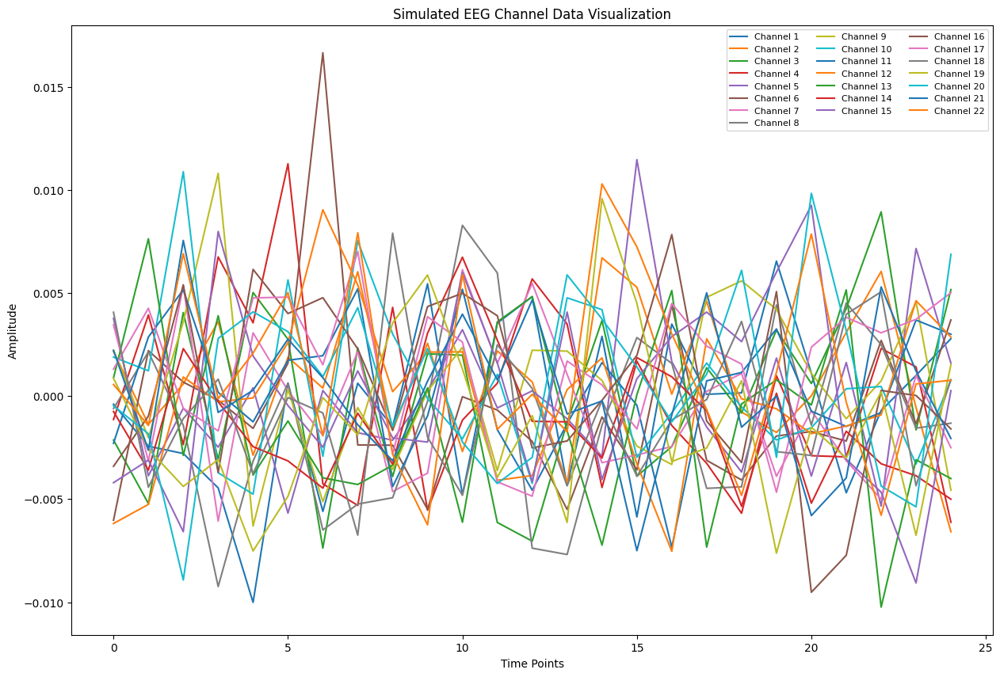

In [4]:
visualize_eeg_weights(convDictionaryModel.spatio_temporal_layers['subject_1'].weight.data, isSqueezed=True)

In [5]:
import torch
from shallow import SubjectOneHotConvNet, CollapsedShallowNet, SubjectOneHotNet, SubjectDicionaryFCNet, SubjectDicionaryConvNet  # Make sure to import your model class

# Initialize the model architecture
model = CollapsedShallowNet(22,4)


# Load the saved state dictionary

state_dict = torch.load('results/CollapsedShallowNet/Models_AllRuns/BNCI2014-001/mixed/CollapsedShallowNet_CollapsedShallowNet_braindecode_example/eegclassifier_fitted_0_model.pkl')

# Load the state dictionary into the model
model.load_state_dict(state_dict)

# Put the model in evaluation mode if you are done with training
model.eval()



CollapsedShallowNet(
  (spatio_temporal): Conv2d(22, 40, kernel_size=(1, 25), stride=(1, 1))
  (pool): AvgPool2d(kernel_size=(1, 100), stride=(1, 100), padding=0)
  (batch_norm): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): LazyLinear(in_features=0, out_features=4, bias=True)
)

In [6]:
print(model.spatio_temporal.weight.data)

tensor([[[[-0.0296, -0.0236, -0.0042,  ...,  0.0608, -0.0097, -0.0315]],

         [[-0.0234, -0.0195,  0.0077,  ...,  0.0010,  0.0138,  0.0337]],

         [[ 0.0291, -0.0142,  0.0003,  ..., -0.0027,  0.0258,  0.0210]],

         ...,

         [[-0.0308, -0.0243,  0.0206,  ...,  0.0191,  0.0412,  0.0086]],

         [[ 0.0103,  0.0160, -0.0203,  ..., -0.0412, -0.0390,  0.0251]],

         [[ 0.0091,  0.0403,  0.0121,  ...,  0.0149, -0.0336, -0.0053]]],


        [[[-0.0377, -0.0211, -0.0258,  ..., -0.0025,  0.0074,  0.0265]],

         [[-0.0379,  0.0019, -0.0029,  ...,  0.0196, -0.0072,  0.0351]],

         [[ 0.0045,  0.0257, -0.0013,  ...,  0.0320,  0.0042,  0.0015]],

         ...,

         [[ 0.0247, -0.0183, -0.0093,  ...,  0.0301, -0.0242, -0.0074]],

         [[ 0.0280,  0.0265, -0.0219,  ...,  0.0338, -0.0254, -0.0125]],

         [[ 0.0072,  0.0052, -0.0212,  ..., -0.0380, -0.0145, -0.0348]]],


        [[[ 0.0019,  0.0006, -0.0035,  ...,  0.0150, -0.0212, -0.0224]],

    

In [7]:
print(model.spatio_temporal.weight.data.shape)

torch.Size([40, 22, 1, 25])


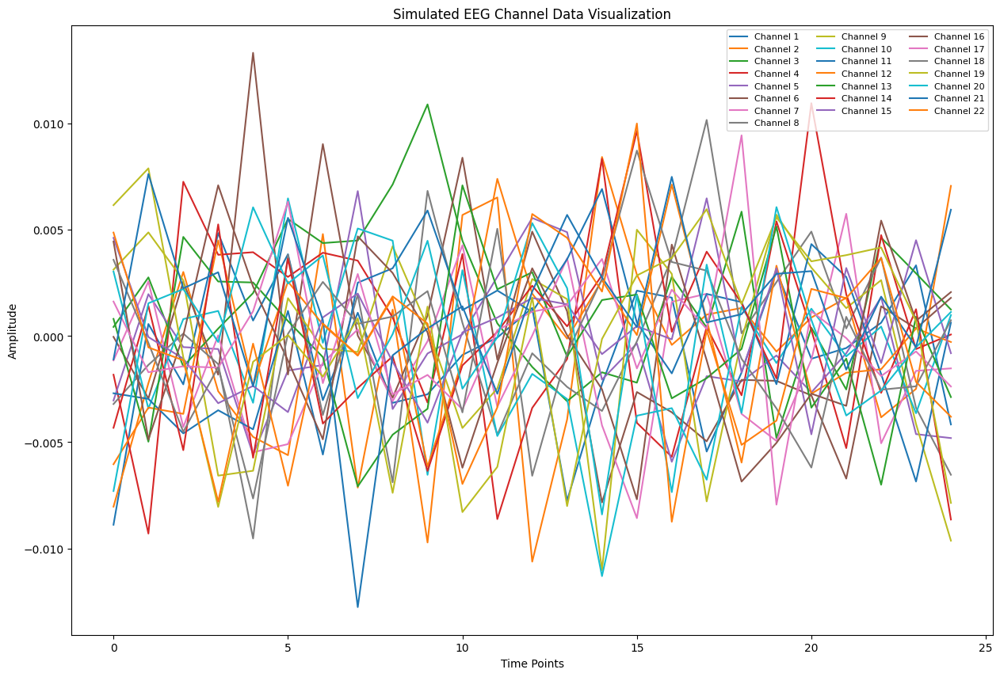

In [8]:
visualize_eeg_weights(model.spatio_temporal.weight.data, isSqueezed=True)

In [9]:
from moabb.datasets import BNCI2014_001
from moabb.paradigms import MotorImagery

paradigm = MotorImagery()
dataset = BNCI2014_001()

X, y, metadata = paradigm.get_data(dataset=dataset, subjects=[1])

Choosing from all possible events
/Users/kasperhenningsen/Desktop/moabb---Private-Encoder-Thesis-/moabb/datasets/preprocessing.py:279: UserWarning: warnEpochs <Epochs | 48 events (all good), 2 – 6 s (baseline off), ~8.1 MB, data loaded,
 'left_hand': 12
 'right_hand': 12
 'feet': 12
 'tongue': 12>
  warn(f"warnEpochs {epochs}")
/Users/kasperhenningsen/Desktop/moabb---Private-Encoder-Thesis-/moabb/datasets/preprocessing.py:279: UserWarning: warnEpochs <Epochs | 48 events (all good), 2 – 6 s (baseline off), ~8.1 MB, data loaded,
 'left_hand': 12
 'right_hand': 12
 'feet': 12
 'tongue': 12>
  warn(f"warnEpochs {epochs}")
/Users/kasperhenningsen/Desktop/moabb---Private-Encoder-Thesis-/moabb/datasets/preprocessing.py:279: UserWarning: warnEpochs <Epochs | 48 events (all good), 2 – 6 s (baseline off), ~8.1 MB, data loaded,
 'left_hand': 12
 'right_hand': 12
 'feet': 12
 'tongue': 12>
  warn(f"warnEpochs {epochs}")
/Users/kasperhenningsen/Desktop/moabb---Private-Encoder-Thesis-/moabb/datasets

In [10]:
X.shape

(576, 22, 1001)

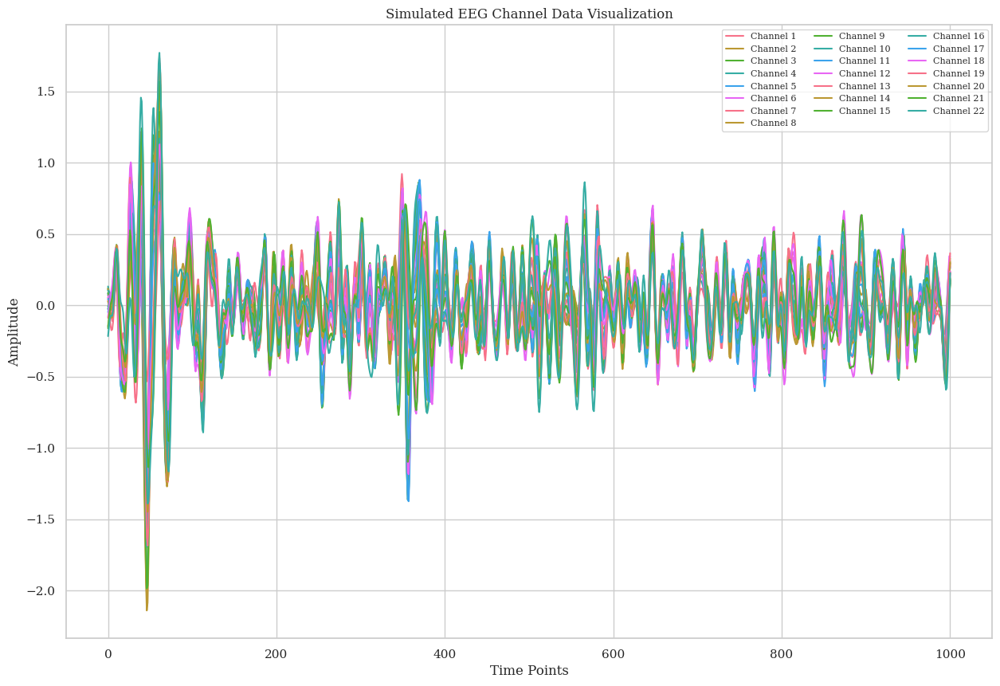

In [11]:
visualize_eeg_weights(X)

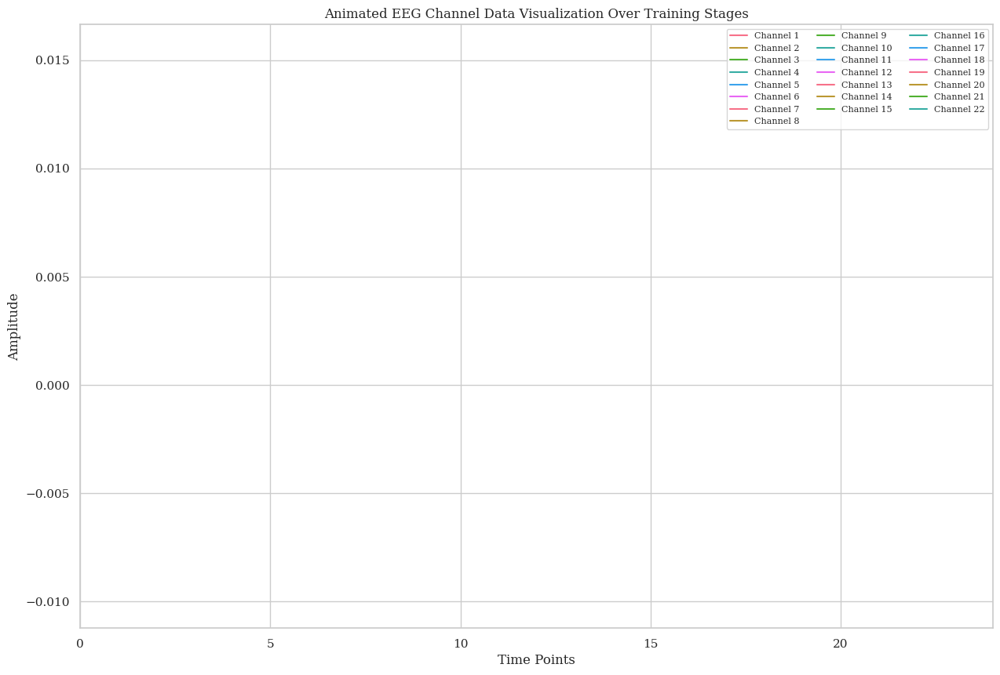

In [48]:
def animate_eeg_weights(data_list, interval=500):
    """
    Creates an animation showing the evolution of EEG-like weights over training epochs.

    Args:
    - data_list (list of tensors): A list where each element is the model's weights at a specific training stage,
                                   with each tensor shaped as (epochs, channels, 1, time_points).
    - interval (int): Time interval between frames in milliseconds (default is 500).
    """
    import matplotlib.pyplot as plt
    from matplotlib.animation import FuncAnimation
    import numpy as np

    # Check data shape and calculate y-limits
    if not data_list or not all(d.shape == data_list[0].shape for d in data_list):
        raise ValueError("All tensors in data_list must have the same shape (epochs, channels, 1, time_points)")

    # Average across epochs for each training stage
    avg_channel_data_list = [data.mean(axis=0) for data in data_list]
    y_min, y_max = np.min([data.min() for data in avg_channel_data_list]), np.max([data.max() for data in avg_channel_data_list])

    # Initialize figure and plot for animation
    fig, ax = plt.subplots(figsize=(15, 10))
    lines = [ax.plot([], [], label=f'Channel {i+1}')[0] for i in range(avg_channel_data_list[0].shape[0])]
    ax.set_xlim(0, avg_channel_data_list[0].shape[-1] - 1)
    ax.set_ylim(y_min, y_max)  # Set dynamic y-limits based on data
    ax.set_title('Animated EEG Channel Data Visualization Over Training Stages')
    ax.set_xlabel('Time Points')
    ax.set_ylabel('Amplitude')
    ax.legend(loc="upper right", ncol=3, fontsize=8)

    # Initialization function for the animation
    def init():
        print("Initializing animation")  # Debug print
        for line in lines:
            line.set_data([], [])
        return lines

    # Update function for each frame in the animation
    def update(frame):
        print(f"Updating frame {frame}")  # Debug print
        avg_channel_data = avg_channel_data_list[frame]
        for i, line in enumerate(lines):
            line.set_data(range(avg_channel_data.shape[-1]), avg_channel_data[i][0])
        ax.set_title(f'Animated EEG Channel Data (Stage {frame + 1})')
        return lines

    # Create the animation without blit
    anim = FuncAnimation(fig, update, frames=len(avg_channel_data_list), init_func=init, interval=interval, blit=False)
    plt.show()
    return anim


# Example usage:
data_stages = [convDictionaryModel.spatio_temporal_layers['subject_1'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_2'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_3'].weight.data] # replace with actual weight tensors during training stages
anim = animate_eeg_weights(data_stages) # Uncomment and provide actual list of tensors when using
anim.resume()


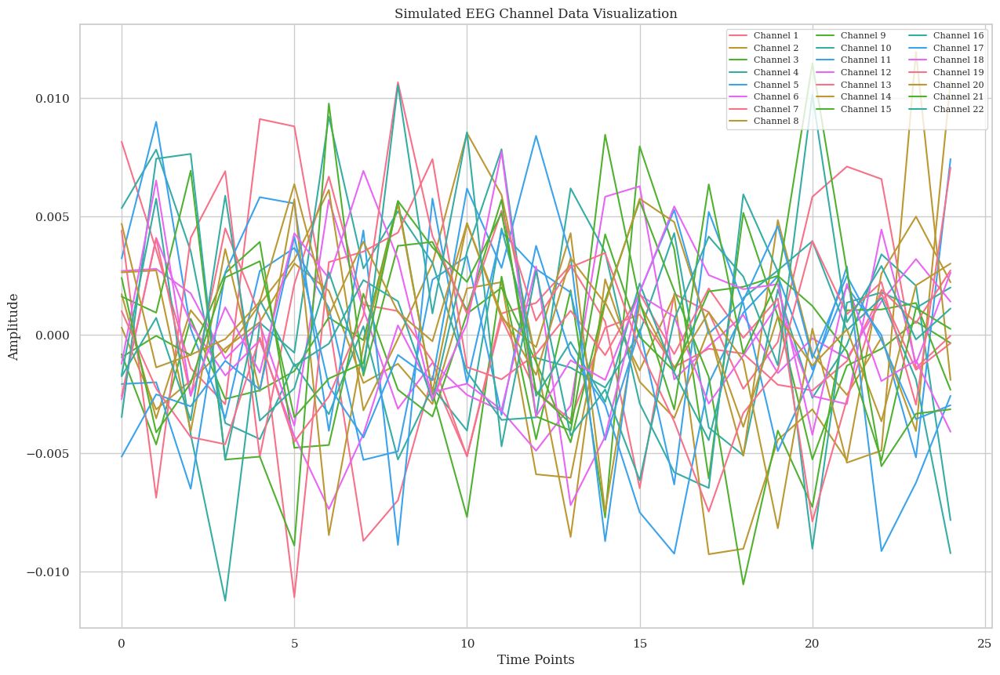

In [13]:
visualize_eeg_weights(convDictionaryModel.spatio_temporal_layers['subject_3'].weight.data, isSqueezed=True)

9
Frame: 0
Frame: 1
Frame: 2
Frame: 3
Frame: 4
Frame: 5
Frame: 6
Frame: 7
Frame: 8


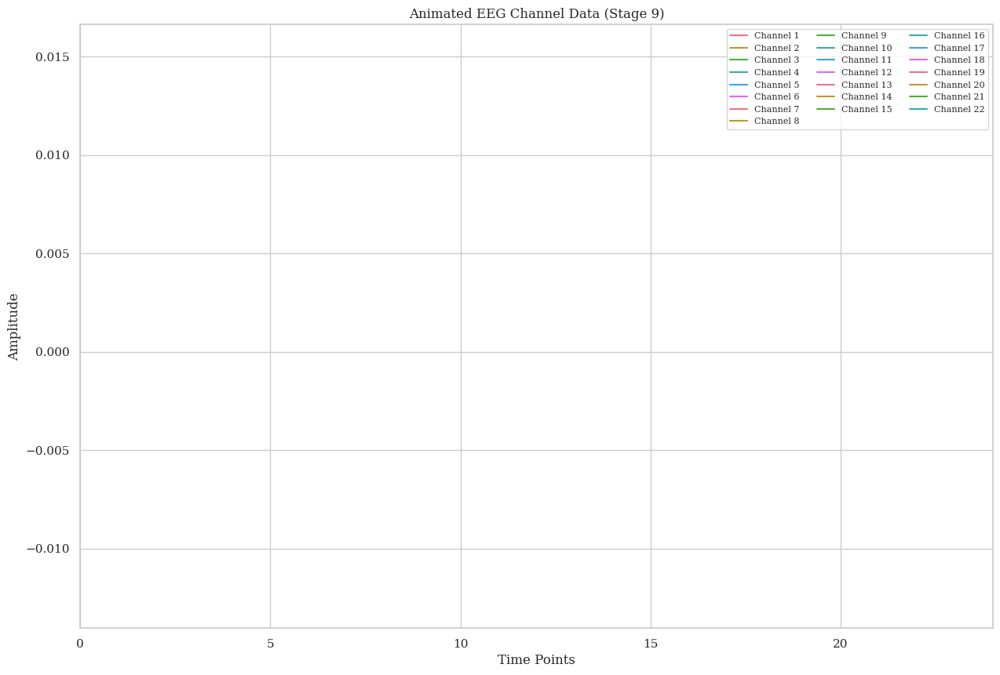

In [49]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from IPython.display import HTML

def animate_eeg_weights(data_list, interval=500):
    """
    Creates an animation showing the evolution of EEG-like weights over training epochs.

    Args:
    - data_list (list of tensors): A list where each element is the model's weights at a specific training stage,
                                   with each tensor shaped as (epochs, channels, 1, time_points).
    - interval (int): Time interval between frames in milliseconds (default is 500).
    """
    # Check data shape and calculate y-limits
    if not data_list or not all(d.shape == data_list[0].shape for d in data_list):
        raise ValueError("All tensors in data_list must have the same shape (epochs, channels, 1, time_points)")

    # Average across epochs for each training stage
    avg_channel_data_list = [data.mean(axis=0) for data in data_list]
    y_min, y_max = np.min([data.min() for data in avg_channel_data_list]), np.max([data.max() for data in avg_channel_data_list])

    # Initialize figure and plot for animation
    fig, ax = plt.subplots(figsize=(15, 10))
    lines = [ax.plot([], [], label=f'Channel {i+1}')[0] for i in range(avg_channel_data_list[0].shape[0])]
    ax.set_xlim(0, avg_channel_data_list[0].shape[-1] - 1)
    ax.set_ylim(y_min, y_max)  # Set dynamic y-limits based on data
    ax.set_title('Animated EEG Channel Data Visualization Over Training Stages')
    ax.set_xlabel('Time Points')
    ax.set_ylabel('Amplitude')
    ax.legend(loc="upper right", ncol=3, fontsize=8)

    # Initialization function for the animation
    def init():
        for line in lines:
            line.set_data([], [])
        return lines

    # Update function for each frame in the animation
    def update(frame):
        print(f"Frame: {frame}")  # Check if all frames are being processed
        avg_channel_data = avg_channel_data_list[frame]
        for i, line in enumerate(lines):
            line.set_data(range(avg_channel_data.shape[-1]), avg_channel_data[i][0])
        ax.set_title(f'Animated EEG Channel Data (Stage {frame + 1})')
        return lines

    
    #ani = animation.FuncAnimation(fig=fig, func=update, frames=40, interval=30)
    #HTML(ani.to_jshtml())

    # Create the animation without blit
    anim = FuncAnimation(fig, update, frames=len(avg_channel_data_list), init_func=init, interval=200, blit=False)

    return anim

# Generating sample data that should work with the animate_eeg_weights function.
# Assume each "stage" in training provides a new set of weights.

# Define parameters for the sample data
epochs = 40       # Number of epochs (time windows)
channels = 22     # Number of channels, simulating EEG channels
time_points = 25  # Number of time points per epoch
stages = 10       # Number of training stages for animation

# Generate random data to simulate EEG-like weights at each stage
#sample_data_list = [np.random.randn(epochs, channels, 1, time_points) for _ in range(stages)]

sample_data_list = [convDictionaryModel.spatio_temporal_layers['subject_1'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_2'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_3'].weight.data,convDictionaryModel.spatio_temporal_layers['subject_4'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_5'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_6'].weight.data,convDictionaryModel.spatio_temporal_layers['subject_7'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_8'].weight.data, convDictionaryModel.spatio_temporal_layers['subject_9'].weight.data] 

print(len(sample_data_list))  # Should match the number of expected frames

# Run the animation with sample data
anima = animate_eeg_weights(sample_data_list)

HTML(anima.to_jshtml())

In [ ]:
import torch
import os
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

def load_weights_for_epochs(model, weight_dir, epoch_range=None):
    """
    Loads weights for each epoch into a dictionary.

    Args:
    - model (torch.nn.Module): The model instance with the same architecture as when saved.
    - weight_dir (str): Directory where weight files are stored.
    - epoch_range (list or range, optional): Range of epochs to load.

    Returns:
    - weight_tensors (dict): Dictionary where keys are epoch numbers and values are corresponding loaded state dictionaries.
    """
    weight_tensors = {}

    # List all weight files in the directory, sorted by epoch number
    weight_files = sorted([f for f in os.listdir(weight_dir) if f.startswith("weights_epoch")])
    if epoch_range is not None:
        weight_files = [f for f in weight_files if int(f.split('_')[-1].split('.')[0]) in epoch_range]
    
    for weight_file in weight_files:
        epoch = int(weight_file.split('_')[-1].split('.')[0])
        weight_path = os.path.join(weight_dir, weight_file)
        state_dict = torch.load(weight_path)
        weight_tensors[epoch] = state_dict
    
    return weight_tensors


model = CollapsedShallowNet(22, 4)

# Load the weights saved per epoch
weight_dir = 'results/CollapsedShallowNet/weights/CollapsedShallowNet/fold_0/'
epoch_weights = load_weights_for_epochs(model, weight_dir, epoch_range=range(20))

# Extract spatio-temporal weights for each epoch
spatio_temporal_weights = []
for epoch, state_dict in epoch_weights.items():
    model.load_state_dict(state_dict)
    weights = model.spatio_temporal.weight.data.clone()  # Keep original shape [40, 22, 1, 25]
    spatio_temporal_weights.append(weights)

# Animate the weights
anamationn = animate_eeg_weights(spatio_temporal_weights)
HTML(anamationn.to_jshtml())


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/lazy.py:181: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


AttributeError: 'SubjectDicionaryConvNet' object has no attribute 'spatio_temporal'

In [ ]:
from shallow import SubjectDicionaryConvNet

import torch
import os
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

def load_weights_for_epochs(model, weight_dir, epoch_range=None):
    """
    Loads weights for each epoch into a dictionary.

    Args:
    - model (torch.nn.Module): The model instance with the same architecture as when saved.
    - weight_dir (str): Directory where weight files are stored.
    - epoch_range (list or range, optional): Range of epochs to load.

    Returns:
    - weight_tensors (dict): Dictionary where keys are epoch numbers and values are corresponding loaded state dictionaries.
    """
    weight_tensors = {}

    # List all weight files in the directory, sorted by epoch number
    weight_files = sorted([f for f in os.listdir(weight_dir) if f.startswith("weights_epoch")])
    if epoch_range is not None:
        weight_files = [f for f in weight_files if int(f.split('_')[-1].split('.')[0]) in epoch_range]
    
    for weight_file in weight_files:
        epoch = int(weight_file.split('_')[-1].split('.')[0])
        weight_path = os.path.join(weight_dir, weight_file)
        state_dict = torch.load(weight_path)
        weight_tensors[epoch] = state_dict
    
    return weight_tensors


model = SubjectDicionaryConvNet(22, 4)

# Load the weights saved per epoch
weight_dir = 'results/SubjectDicionaryConvNet/weights/SubjectDicionaryConvNet/fold_0/'
epoch_weights = load_weights_for_epochs(model, weight_dir, epoch_range=range(20))

# Extract spatio-temporal weights for each epoch
spatio_temporal_weights = []
for epoch, state_dict in epoch_weights.items():
    model.load_state_dict(state_dict)
    weights = model.spatio_temporal_layers['subject_1'].weight.data.clone()  # Keep original shape [40, 22, 1, 25]
    spatio_temporal_weights.append(weights)

# Animate the weights
anamationn = animate_eeg_weights(spatio_temporal_weights)
HTML(anamationn.to_jshtml())
